<a href="https://colab.research.google.com/github/GijsBarmentlo/LearningDataScience/blob/master/SolarPanelDetection_25x25_Improved.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set up environment

In [0]:
#importing libraries

#Basics
import gc
import os
from tqdm import tqdm
import numpy as np
import pandas as pd
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

#Reading files
import cv2
from google.colab.patches import cv2_imshow #ToDo replace by cv2.imshow('img for local implementation
import urllib
import gzip

#Using the public dataset
! pip install geopandas
import geopandas as gpd
from shapely.geometry import Polygon
from ast import literal_eval

#Keras
from keras.models import Sequential
from keras.layers import Dense
!pip install keras-metrics
import keras_metrics as km
from keras_metrics import binary_precision
from keras_metrics import binary_recall
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
recall = tf.compat.v1.keras.metrics.Recall
precision = tf.compat.v1.keras.metrics.Precision

     |████████████████████████████████| 921kB 2.8MB/s 
     |████████████████████████████████| 11.8MB 62.4MB/s 
     |████████████████████████████████| 10.1MB 43.3MB/s 


Using TensorFlow backend.


In [0]:
#use my drive as HDD
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Parameters

In [0]:
debug = False
generating_data = False #to avoid running cells that write images of parcels to disk every time
parcelleOuBat = 'parcelles' #mettre parcelles ou batiments pour cadastre correspondant

set_window_size = 25 #avg surface of panel is 40pix or 7*7square
set_step = 10
pred_step = set_window_size

img_window_shape = (set_window_size,set_window_size,3)
mask_window_shape = (set_window_size,set_window_size)
img_step = (set_step,set_step,3)
mask_step = (set_step,set_step)
pred_img_window_shape = (set_window_size,set_window_size,3)
pred_img_step = (pred_step, pred_step,3)


# Get images from cadastre

import function to get image

In [0]:
#@title
#function to get images from cadastre
"""
Allows to pass a parcel list to return sataleite image
"""

__author__ = "Luko"
__email__ = "benoit@luko.eu"
__status__ = "Prototype"

from threading import Thread
from urllib.request import urlopen

import cv2
import numpy as np
from pyproj import transform, Proj
from shapely.geometry import shape
from shapely.ops import unary_union


def geoJSON_to_satellite_view(list_parcelles):
    parcelles_obj_list = []
    for parcelle in list_parcelles:
        parcelles_obj_list.append(shape(parcelle['geometry']))
    big_parcelle = unary_union(parcelles_obj_list)

    minx, miny, maxx, maxy = big_parcelle.bounds
    min_col, max_col, min_row, max_row = get_titles_list(minx, miny, maxx, maxy)

    img = None
    thread_img = {}

    for row in range(min_row, max_row+1):
        for col in range(min_col, max_col + 1):
            thread_img[col, row] = ThreadImager(col, row)
            thread_img[col, row].start()

    for row in range(min_row, max_row+1):
        img0 = None
        for col in range(min_col, max_col + 1):
            thread_img[col, row].join()
            image = thread_img[col, row].image
            if img0 is None:
                img0 = image
            else:
                img0 = np.concatenate((img0, image), axis=1)
        if img is None:
            img = img0
        else:
            img = np.concatenate((img, img0), axis=0)

    height = img.shape[0]
    width = img.shape[1]
    mask = np.zeros((height, width), dtype=np.uint8)

    p_array = []
    if big_parcelle.type == "Polygon":
        big_parcelle = [big_parcelle]
    for poly in list(big_parcelle):
        xy_array = np.array(poly.exterior.coords.xy)
        pix_x, pix_y = convert_to_pixel(min_col, min_row, xy_array[0], xy_array[1])
        p_array.append(np.transpose(np.array([pix_x, pix_y])))
    points = np.array(p_array)
    cv2.fillPoly(mask, points, (255))
    res = cv2.bitwise_and(img, img, mask=mask)

    points=np.concatenate(points, axis=0)
    rect = cv2.boundingRect(points)  # returns (x,y,w,h) of the rect
    cropped = res[rect[1]: rect[1] + rect[3], rect[0]: rect[0] + rect[2]]

    tl_x, tl_y = get_title_top_left_corner(min_col, min_row)
    return res, [tl_x, tl_y]


def get_titles_list(minx, miny, maxx, maxy):
    min_col, min_row = convert_to_title(minx, miny)
    max_col, max_row = convert_to_title(maxx, maxy)
    if(min_col>max_col):
        temp = min_col
        min_col = max_col
        max_col = temp
    if(min_row>max_row):
        temp = min_row
        min_row = max_row
        max_row = temp
    return min_col, max_col, min_row, max_row


def convert_to_pixel(min_col, min_row, x_list, y_list):
    X_LIST, Y_LIST = transform(Proj(init='epsg:4326'), Proj(init='epsg:3857'), x_list, y_list)
    X0 = -20037508.3427892476320267
    Y0 = 20037508.3427892476320267
    Resolution = 0.2985821417
    X1 = X0 + min_col *(256 * Resolution)
    Y1 = Y0 - min_row *(256 * Resolution)

    pixels_x = (X_LIST - X1)/Resolution
    pixels_y = (Y1 - Y_LIST)/Resolution

    pixels_x = np.around(pixels_x).astype(int)
    pixels_y = np.around(pixels_y).astype(int)
    return pixels_x, pixels_y


def convert_from_pixel(top_pixel_position, x_list, y_list):
    Resolution = 0.2985821417
    x_list = top_pixel_position[0] + (x_list * Resolution)
    y_list = top_pixel_position[1] - (y_list * Resolution)
    x_list, y_list = transform(Proj(init='epsg:3857'), Proj(init='epsg:4326'), x_list, y_list)
    return x_list, y_list


def convert_to_title(x, y):
    X, Y = transform(Proj(init='epsg:4326'), Proj(init='epsg:3857'), x, y)
    X0 = -20037508.3427892476320267
    Y0 = 20037508.3427892476320267
    Resolution = 0.2985821417
    TILECOL = int((X - X0) / (256 * Resolution))
    TILEROW = int((Y0 - Y) / (256 * Resolution))
    return TILECOL, TILEROW

def get_title_top_left_corner(col, row):
    X0 = -20037508.3427892476320267
    Y0 = 20037508.3427892476320267
    Resolution = 0.2985821417
    X = (col * 256 * Resolution) + X0
    Y = Y0 - (row * 256 * Resolution)
    return X, Y


class ThreadImager(Thread):
    def __init__(self, col, row):
        Thread.__init__(self)
        self.col = col
        self.row = row
        self.image = None

    def run(self):
        self.image = self.url_to_image()
        return True

    def get_tiles_url(self):
        return f"http://wxs.ign.fr/pratique/geoportail/wmts?service=WMTS&request=GetTile" \
              f"&version=1.0.0&layer=ORTHOIMAGERY.ORTHOPHOTOS" \
              f"&tilematrixset=PM&tilematrix=19&" \
              f"tilecol={self.col}&" \
              f"tilerow={self.row}&" \
              f"layer=ORTHOIMAGERY.ORTHOPHOTOS&format=image/jpeg&style=normal"


    def url_to_image(self, readFlag=cv2.IMREAD_COLOR):
        resp = urlopen(self.get_tiles_url())
        image = np.asarray(bytearray(resp.read()), dtype="uint8")
        image = cv2.imdecode(image, readFlag)
        return image



#### EXAMPLE


In [0]:
def import_geoJSON_as_list_insee(insee):  
    insee = str(insee)
    dept_str = insee[:2]
    url = f'https://cadastre.data.gouv.fr/data/etalab-cadastre/2019-10-01/geojson/communes/{dept_str}/{insee}/cadastre-{insee}-{parcelleOuBat}.json.gz'
    testfile = urllib.request.URLopener()
    testfile.retrieve(url, "file.gz")
    with gzip.open('file.gz',"rb") as f:
        df = pd.read_json(f.read().decode("utf-8"))
    return df.features.squeeze()

In [0]:
def crop_image(img,tol=0):
    # img is 2D image data
    # tol  is tolerance
    mask = img[:,:,1]>tol #hypothesis, if one value of the RGB vector is null then the whole vector isnull
    return img[np.ix_(mask.any(1),mask.any(0))]

In [0]:
def save_img_to_disk(insee,type=parcelleOuBat):
    path = os.path.join(root_dir,f'photos_{insee}_{type}')
    os.mkdir(path)
    if debug:print('in save_img_to_disk directory created')
    i=0
    desc = f'photos_{insee}_{type}'
    for parcelle in tqdm(import_geoJSON_as_list_insee(insee),desc):
        if debug:print(f'in save_img_to_disk, at parcelle n°{i}')
        res, _gps_corner = geoJSON_to_satellite_view([parcelle])
        name = f'{i}.png'
        cv2.imwrite(os.path.join(path , name), crop_image(res))
        i = i+1

In [0]:
if generating_data:
  save_img_to_disk(21035,'parcelles')
  save_img_to_disk(21035,'batiments')

In [0]:
def save_sat_img_to_RAM(insee_list,type=parcelleOuBat):
  parcelle_img_dict={}
  for code_insee in insee_list:
    parcelle_image_list = []
    for parcelle in tqdm(import_geoJSON_as_list_insee(code_insee),desc=f'parcelles for {code_insee}'):
      res, _gps_corner = geoJSON_to_satellite_view([parcelle])
      parcelle_image_list.append(crop_image(res))
    parcelle_img_dict[code_insee] = parcelle_image_list
  return parcelle_img_dict

In [0]:
if generating_data:
  insee_list = [93029]  #grenoble 38185  et clermont ferrant 63113
  save_sat_img_to_RAM(insee_list)

We now have satellite photos of both buildings and parcels saved to disk

# Create train data

#### Approach

chosen structure will be to feed in a few pixels at a time (sliding windows maybe) and the average luminisity of the picture so as to compensate for the weather when the picture was taken, output will be a confidence that the central pixel/window is inside of a solar panel. With this i can take images from any resolution and reconstruct a mask giving the prob of each pixel being in a solar panel. (interpolate to go from mask resolution to image resolution)

Steps :
* Build a training dataset of images and corresponding mask
* Train neural network (or other classifier)
* Cross validate model and generate metrics
* Try it out on data and check if positives are good

data from Bradbury, Kyle; Saboo, Raghav; Johnson, Timothy; Malof, Jordan; Devarajan, Arjun; Zhang, Wuming; et al. (2016): Full Collection: Distributed Solar Photovoltaic Array Location and Extent Data Set for Remote Sensing Object Identification. figshare. Collection.

#### Import

In [0]:
metadata_path = root_dir +'/SolarData/Metadata/'
picture_path = root_dir +'/SolarData/Photos/'

### Geo data

In [0]:
#let's read our geoJSON data
file_name = 'SolarArrayPolygons.geojson'
geo_df = gpd.read_file(os.path.join(metadata_path,file_name))
geo_df.head()

,polygon_id,centroid_latitude,centroid_longitude,centroid_latitude_pixels,centroid_longitude_pixels,city,area_pixels,area_meters,image_name,nw_corner_of_image_latitude,nw_corner_of_image_longitude,se_corner_of_image_latitude,se_corner_of_image_longitude,datum,projection_zone,resolution,jaccard_index,polygon_vertices_pixels,geometry
0,1,36.926310,-119.840555,107.618458,3286.151487,Fresno,136.192872,1513.254134,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.914020,"[ [ 3360.4950690000001, 131.6311637 ], [ 3249....","POLYGON ((-119.84030 36.92625, -119.84068 36.9..."
1,2,36.926477,-119.840561,45.977659,3286.352946,Fresno,155.511714,1727.907934,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.829071,"[ [ 3361.1538460000002, 69.61538462 ], [ 3217....","POLYGON ((-119.84031 36.92642, -119.84080 36.9..."
2,3,36.926542,-119.840506,22.280851,3303.465657,Fresno,111.796591,1242.184349,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.937961,"[ [ 3358.0157260000001, 48.136863220000002 ], ...","POLYGON ((-119.84032 36.92648, -119.84032 36.9..."
3,4,36.921008,-119.842847,2048.362567,2547.366116,Fresno,62.004008,688.933420,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.842634,"[ [ 2571.5917159999999, 2068.0493099999999 ], ...","POLYGON ((-119.84276 36.92096, -119.84277 36.9..."
4,5,36.920976,-119.842906,2060.014890,2529.504997,Fresno,95.480150,1060.890554,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.890998,"[ [ 2563.7810650000001, 2091.3984220000002 ], ...","POLYGON ((-119.84279 36.92089, -119.84299 36.9..."


all polygons have unique ID's, since we will be working on images pixel data will be most usefull 
* ToDo drop useless columns
* ToDo, round values and reduce types to save memory
* ToDo add features (like avg luminosity around the panel, avg color, etc)




In [0]:
#closer look at polygon vertices and geometry
print('polygon_vertices_pixels column looks like : ', geo_df.loc[0,'polygon_vertices_pixels'])
print('\n\ngeometry column looks like : ', geo_df.loc[0,'geometry'])

polygon_vertices_pixels column looks like :  [ [ 3360.4950690000001, 131.6311637 ], [ 3249.1977099999999, 87.985140549999997 ], [ 3213.75, 73.849999999999994 ], [ 3210.4499999999998, 81.950000000000003 ], [ 3212.3991550000001, 82.734514840000003 ], [ 3212.1913209999998, 83.280078900000007 ], [ 3355.6193290000001, 140.57001969999999 ], [ 3360.4950690000001, 131.6311637 ] ]


geometry column looks like :  POLYGON ((-119.8403028528537 36.92625126752494, -119.8406816707425 36.92636019465177, -119.84080234595 36.9263955197238, -119.840812638602 36.92637337488181, -119.8408060023355 36.92637141283549, -119.8408066470241 36.92636992246358, -119.8403183631028 36.92622672990362, -119.8403028528537 36.92625126752494))


geometry is latitude not pixel data, we're gonna work with polygon_vertices_pixels column

In [0]:
#polygon_vertices_pixels is a string, we need it to be tuple to feed it to shapely and get polygons
geo_df['polygon_vertices_tuple'] = geo_df.polygon_vertices_pixels.apply(lambda x:literal_eval(x.replace('[','(').replace(']',')')))
geo_df['polygon'] = geo_df.polygon_vertices_tuple.apply(lambda x:Polygon(x))

In [0]:
#checking for missing values
geo_df.isna().sum()

polygon_id                      0
centroid_latitude               0
centroid_longitude              0
centroid_latitude_pixels        0
centroid_longitude_pixels       0
city                            0
area_pixels                     0
area_meters                     0
image_name                      0
nw_corner_of_image_latitude     0
nw_corner_of_image_longitude    0
se_corner_of_image_latitude     0
se_corner_of_image_longitude    0
datum                           0
projection_zone                 0
resolution                      0
jaccard_index                   0
polygon_vertices_pixels         0
geometry                        0
polygon_vertices_tuple          0
polygon                         0
dtype: int64

No NaN values, good

There was an issue caused by polygons with negative index vertices, there's only 9 of them so we can drop

In [0]:
geo_df['contains_minus']= geo_df.polygon_vertices_pixels.apply(lambda x : '-' in x)
print(geo_df.polygon_vertices_pixels[geo_df['contains_minus']].shape) #there's only 9 of them
print(geo_df.shape)
geo_df = geo_df.drop(geo_df[geo_df['contains_minus']].index)
print(geo_df.shape)

(9,)
(19433, 22)
(19424, 22)


In [0]:
#having a look at types
geo_df.dtypes

polygon_id                         int64
centroid_latitude                float64
centroid_longitude               float64
centroid_latitude_pixels         float64
centroid_longitude_pixels        float64
city                              object
area_pixels                      float64
area_meters                      float64
image_name                        object
nw_corner_of_image_latitude      float64
nw_corner_of_image_longitude     float64
se_corner_of_image_latitude      float64
se_corner_of_image_longitude     float64
datum                             object
projection_zone                   object
resolution                       float64
jaccard_index                    float64
polygon_vertices_pixels           object
geometry                        geometry
polygon_vertices_tuple            object
polygon                           object
contains_minus                      bool
dtype: object

In [0]:
geo_df.groupby('city').polygon_id.count()

city
Fresno      14707
Modesto       581
Oxnard       1592
Stockton     2544
Name: polygon_id, dtype: int64

Solar panels mainly in fresno

In [0]:
#dropping columns in coordinates, keeping pixel related data only
coordinate_cols = ['centroid_latitude','centroid_longitude','nw_corner_of_image_latitude','nw_corner_of_image_longitude','se_corner_of_image_latitude','se_corner_of_image_longitude']
geo_df.drop(coordinate_cols,axis=1,inplace=True)

### Picture data

#### listing pictures i have (i dont have all picture names described in data set

In [0]:
#I do not have all of the df, this way i can iterate only over the pics i have
# FYI picture_path = root_dir +'/SolarData/Photos/'
pictures_i_have = []
for root, dirs, files in os.walk(picture_path):
    for filename in files:
        if 'xml' not in filename:
          pictures_i_have.append(filename[:-4]) #removing the file extension to match geo_df column

In [0]:
# Useless, replaced by a condition in loop
#to avoid later errors, let's check which pictures have 0 solar panels, we will not iterate over them and avoid empty dataframes
pictures_with_panels = []
for pic in pictures_i_have:
  if (geo_df['image_name']==pic).sum()!=0:
    pictures_with_panels.append(pic)
    if debug:print(pictures_i_have.index(pic))
if debug : print(pictures_with_panels)

#these pictures generated errors, to investigate
def pop_unwanted(dirty_list):
  clean_list=dirty_list.copy()
  clean_list.pop(30)
  clean_list.pop(28)
  clean_list.pop(22)
  clean_list.pop(21)
  clean_list.pop(18)
  clean_list.pop(18)
  return clean_list

pictures_with_panels = pop_unwanted(pictures_with_panels) 

In [0]:
# list of pictures of forest, will be used to generate negative examples
pictures_of_forests = []
for root, dirs, files in os.walk(os.path.join(root_dir,'SolarData','Forests')):
    for filename in files:
        if 'xml' not in filename:
          pictures_of_forests.append(filename) #with file extension, incoherent with previous list

#### Generating mask in the proper format (H*L numpy array)



*   remove lines for which i do not have the picture yet
*   create empty mask
*   go through all polygons related to that picture and set mask to one inside polygons
* NB. do image per image to not overload ram needlessly



In [0]:
def mask_from_polygons(polygons, im_size):
    """Convert a polygon or multipolygon list back to
       an image mask ndarray"""

    if len(polygons)==0:
      if debug:print('null mask returned')
      return np.full(im_size,0,np.uint8)

    img_mask = np.full(im_size,0,np.uint8)

    # function to round and convert to int
    int_coords = lambda x: np.array(x).round().astype(np.int32)
    exteriors = [int_coords(poly.exterior.coords) for poly in polygons]
    #interiors = [int_coords(pi.coords) for poly in polygons for pi in poly.interiors]

    #cv2.fillPoly(img_mask, interiors, 255)
    cv2.fillPoly(img_mask, exteriors, 255)

    return img_mask

In [0]:
def mask(pic_name):
  polygons = geo_df.polygon[geo_df['image_name']==pic_name]
  mask = mask_from_polygons(polygons,(5000,5000))
  return mask

def mask_dict(picture_name_list):
  mask_dict = {}
  for pic in picture_name_list:
    mask_dict[pic] = mask(pic)
  return mask_dict

#### Create subset focused around solar panels to train model

cut bits of photos around the solar panels to have a balanced train set (data very skewed, less than 1% of surface are solar panels, otherwise model will simply predict 0 all the time)

In [0]:
def truncate_around_panels(img_name):
  """
  return tuple : (list of truncated images, list of truncated masks)
  """
  margin = 5 #will determine the amount of negative examples in dataset
  img = cv2.imread(picture_path+img_name+'.tif')
  img_mask = mask(img_name)
  truncated_img_list = []
  truncated_mask_list = []
  int_coords = lambda x: np.array(x).round().astype(np.int32)
  polygons = geo_df.polygon[geo_df['image_name']==img_name]

  for polygon in polygons:
    minx, miny, maxx, maxy = int_coords(polygon.bounds) #beware of numpy indexing

    # make truncated pic a multiple of set_window_size to avoid losing the right edge systematically
    maxx += (set_window_size - (((maxx - minx)+2*margin)%set_window_size)) 
    maxy += (set_window_size - (((maxy - miny)+2*margin)%set_window_size)) 

    if debug and ((miny-margin)<0 or (minx-margin)<0 or (maxy+margin)>img.shape[0] or (maxx+margin)>img.shape[0]):
      print (f'negative index for truncated image in {img_name}')

    truncated_img_list.append(img[miny-margin:maxy+margin, minx-margin:maxx+margin,:].copy()) #this is all refencing to the same object considering there was no .copy, saves ram but beware
    truncated_mask_list.append(img_mask[miny-margin:maxy+margin, minx-margin:maxx+margin].copy())
    if (debug==2):print('in truncate_around_polygon ',polygon)
    
  return truncated_img_list,truncated_mask_list

#### Window slider

In [0]:
#Take as input an image of any size and outputs list of all windows it contains
#code from meowklaski
def sliding_window_view(arr, window_shape, steps):
    """ Produce a view from a sliding, striding window over `arr`.
        The window is only placed in 'valid' positions - no overlapping
        over the boundary.
        Parameters
        ----------
        arr : numpy.ndarray, shape=(...,[x, (...), z])
            The array to slide the window over.
        window_shape : Sequence[int]
            The shape of the window to raster: [Wx, (...), Wz],
            determines the length of [x, (...), z]
        steps : Sequence[int]
            The step size used when applying the window
            along the [x, (...), z] directions: [Sx, (...), Sz]
        Returns
        -------
        view of `arr`, shape=([X, (...), Z], ..., [Wx, (...), Wz])
            Where X = (x - Wx) // Sx + 1
        Notes
        -----
        In general, given
          `out` = sliding_window_view(arr,
                                      window_shape=[Wx, (...), Wz],
                                      steps=[Sx, (...), Sz])
           out[ix, (...), iz] = arr[..., ix*Sx:ix*Sx+Wx,  (...), iz*Sz:iz*Sz+Wz]
         Examples
         --------
         >>> import numpy as np
         >>> x = np.arange(9).reshape(3,3)
         >>> x
         array([[0, 1, 2],
                [3, 4, 5],
                [6, 7, 8]])
         >>> y = sliding_window_view(x, window_shape=(2, 2), steps=(1, 1))
         >>> y
         array([[[[0, 1],
                  [3, 4]],
                 [[1, 2],
                  [4, 5]]],
                [[[3, 4],
                  [6, 7]],
                 [[4, 5],
                  [7, 8]]]])
        >>> np.shares_memory(x, y)
         True
        # Performing a neural net style 2D conv (correlation)
        # placing a 4x4 filter with stride-1
        >>> data = np.random.rand(10, 3, 16, 16)  # (N, C, H, W)
        >>> filters = np.random.rand(5, 3, 4, 4)  # (F, C, Hf, Wf)
        >>> windowed_data = sliding_window_view(data,
        ...                                     window_shape=(4, 4),
        ...                                     steps=(1, 1))
        >>> conv_out = np.tensordot(filters,
        ...                         windowed_data,
        ...                         axes=[[1,2,3], [3,4,5]])
        # (F, H', W', N) -> (N, F, H', W')
        >>> conv_out = conv_out.transpose([3,0,1,2])
         """
    import numpy as np
    from numpy.lib.stride_tricks import as_strided
    in_shape = np.array(arr.shape[-len(steps):])  # [x, (...), z]
    window_shape = np.array(window_shape)  # [Wx, (...), Wz]
    steps = np.array(steps)  # [Sx, (...), Sz]
    nbytes = arr.strides[-1]  # size (bytes) of an element in `arr`

    # number of per-byte steps to take to fill window
    window_strides = tuple(np.cumprod(arr.shape[:0:-1])[::-1]) + (1,)
    # number of per-byte steps to take to place window
    step_strides = tuple(window_strides[-len(steps):] * steps)
    # number of bytes to step to populate sliding window view
    strides = tuple(int(i) * nbytes for i in step_strides + window_strides)

    outshape = tuple((in_shape - window_shape) // steps + 1)
    # outshape: ([X, (...), Z], ..., [Wx, (...), Wz])
    outshape = outshape + arr.shape[:-len(steps)] + tuple(window_shape)
    return as_strided(arr, shape=outshape, strides=strides, writeable=False).squeeze()

#### Making positive dataset

In [0]:
#@title
def new_create_training_arrays(picture_list):
  #for every picture we crop it around it's polygons (panels), make the sliding windows of these cropped images and return it in vector shape te feed into NN
  mask_window_list = np.empty(shape=(0,set_window_size,set_window_size))
  img_window_list = np.empty(shape=(0,set_window_size,set_window_size,3)) #of windows 2D + color channel
  empty_masks_count = 0

  for picture_name in tqdm(picture_list): #for every picture
    if debug: print('\n\nindex of picture name',picture_list.index(picture_name));i=0;m=0
    cropped_img_list,cropped_mask_list = truncate_around_panels(picture_name) #we crop^around panels
    k = 0
    
    for cropped_img in cropped_img_list : #for every crop
      if debug: print('index of cropped img ',i);i+=1
      window_list_2D = sliding_window_view(cropped_img, img_window_shape, img_step) #we get the sliding windows
      if debug : print(f'size of window_list_2D : {window_list_2D.shape}')
      img_window_list = np.concatenate((img_window_list,window_list_2D),axis=0) #and we put it into window shape
      

    for cropped_mask in cropped_mask_list:
      if debug: print('index of cropped mask ',m);m+=1

      if 0 not in cropped_mask.shape:
        window_list_2D = sliding_window_view(cropped_mask.astype(int), mask_window_shape, mask_step)
        mask_window_list = np.concatenate((mask_window_list,window_list_2D),axis=0)

      else:
        print(f'had to add empty mask at {picture_name} , croppped mask index {k}')
        window_list_2D = sliding_window_view(cropped_img_list[k], img_window_shape, img_step)
        number_of_rows = window_list_2D.shape[0]
        mask_window_list = np.concatenate((mask_window_list,np.zeros((number_of_rows,set_window_size*set_window_size))),axis=0)

        if debug:print('image vectors : ',img_window_list.shape[0])
        if debug:print('mask_vectors : ',mask_window_list.shape[0])
        empty_masks_count += 1
      
      k += 1
    if debug:
      print('image vectors : ',img_window_list.shape[0])
      print('mask_vectors : ',mask_window_list.shape[0])
      print('number of empty masks added : ',empty_masks_count)

  return mask_window_list,img_window_list        

In [0]:
def create_training_arrays(picture_list):
  #for every picture we crop it around it's polygons (panels), make the sliding windows of these cropped images and return it in vector shape te feed into NN
  mask_window_list = np.empty(shape=(0,set_window_size*set_window_size))
  img_window_list = np.empty(shape=(0,set_window_size,set_window_size,3)) #list where every row is a flattened out window pixels vector
  empty_masks_count = 0

  for picture_name in tqdm(picture_list): #for every picture
    if debug: print('\n\nindex of picture name',picture_list.index(picture_name));i=0;m=0
    cropped_img_list,cropped_mask_list = truncate_around_panels(picture_name) #we crop^around panels
    k = 0

    for cropped_img in cropped_img_list : #for every crop
      if debug: print('index of cropped img ',i);i+=1
      window_list_2D = sliding_window_view(cropped_img, img_window_shape, img_step) #we get the sliding windows
      img_window_list = np.concatenate((img_window_list,reshape_windows(window_list_2D, form = 'image')),axis=0) #and we put it into vector shape
      
    
    for cropped_mask in cropped_mask_list:
      if debug: print('index of cropped mask ',m);m+=1

      if 0 not in cropped_mask.shape:
        window_list_2D = sliding_window_view(cropped_mask.astype(int), mask_window_shape, mask_step)
        mask_window_list = np.concatenate((mask_window_list,reshape_windows(window_list_2D, form = 'mask')),axis=0)

      else:
        print(f'had to add empty mask at {picture_name} , croppped mask index {k}')
        window_list_2D = sliding_window_view(cropped_img_list[k], img_window_shape, img_step)
        number_of_rows = reshape_windows(window_list_2D, form = 'image').shape[0]

        #img_vector_list = np.delete(img_vector_list, range(mask_vector_list.shape[0],mask_vector_list.shape[0]+number_of_rows))
        mask_window_list = np.concatenate((mask_window_list,np.zeros((number_of_rows,set_window_size*set_window_size))),axis=0)

        if debug:print('image vectors : ',img_window_list.shape[0])
        if debug:print('mask_vectors : ',mask_window_list.shape[0])
        empty_masks_count += 1
      
      k += 1
    if debug:
      print('image vectors : ',img_window_list.shape[0])
      print('mask_vectors : ',mask_window_list.shape[0])
      print('number of empty masks added : ',empty_masks_count)

  return mask_window_list,img_window_list        

def reshape_windows(windows_list, form):

  #get the number of windows by counting total pixels and dividing by pixels per window ; define output shape
  
  if form == 'image' :
    pixels_per_window = set_window_size*set_window_size*3 #multiply by 3 for RGB
    number_of_windows = int(windows_list.size / pixels_per_window)
    output_shape = (number_of_windows, set_window_size, set_window_size, 3) #reshape as list if 2D windows (input format of convo layer)

  if form == 'mask' :
    pixels_per_window = set_window_size*set_window_size
    number_of_windows = int(windows_list.size / pixels_per_window)
    output_shape = (number_of_windows, set_window_size*set_window_size) #reshape as list of vectors (output format of dense layer)

  if debug:print(f'windows_list.shape = {windows_list.shape}, pixels_per_window = {pixels_per_window}, number_of_windows = {number_of_windows}')

  return np.reshape(windows_list,output_shape)



In [0]:
def windows_to_vectors(windows_list):
  pixels_per_window = set_window_size*set_window_size
  #number_of_windows = windows_list.shape[0]*windows_list.shape[1] #generates errors if windows only slides in one direction output array then has one dim less
  
  

  if windows_list.shape[-1] == 3 :
    pixels_per_window = 3* pixels_per_window #multiply by 3 for RGB

  number_of_windows = int(windows_list.size / pixels_per_window)

  if debug:print(f'windows_list.shape = {windows_list.shape}, pixels_per_window = {pixels_per_window}, number_of_windows = {number_of_windows}')

  return np.reshape(windows_list,(number_of_windows,pixels_per_window))

In [0]:
def test_train_array_generation(picture_list = pictures_with_panels):
  debug=True #set debug = 2 to have all polygons printed (from generate mask from polygons)

  print('picture list used : ',picture_list)
  
  mask_windows_list, img_windows_list = create_training_arrays(pictures_list) #need to find second source of negative indexes to use rest of training data"
  
  print('number of training windows generated : ', img_windows_list.shape[0])

  if mask_windows_list.shape[0] != img_windows_list.shape[0]:
    print('Image and mask arrays do not have the same number of row, check how null masks are handled in mask loop')

#### Add some forests to training data

In [0]:
def vectors_from_empty_image(picture):
  """
  this fuction will return the picture in the correct format (cut in windows, turned into vectors) and return the associated all zero mask
  """

  #initiate empty arrays
  mask_vector_list = np.empty(shape=(0,set_window_size*set_window_size))
  img_vector_list = np.empty(shape=(0,set_window_size*set_window_size*3))

  #turn image into windows, shape them as vectors
  window_list_2D = sliding_window_view(picture, img_window_shape, img_step) #we get the sliding windows
  img_vector_list = reshape_windows(window_list_2D, form = 'image') #and we put it into vector shape  

  #add null mask of the proper size
  number_of_rows = img_vector_list.shape[0]
  mask_vector_list = np.zeros((number_of_rows,set_window_size*set_window_size))

  return mask_vector_list, img_vector_list

# Models

### Imports

### Evaluation functions


In [0]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [0]:
def lf_threshold(y_true,y_pred,number_of_cuts = 10):
  y_true = y_true.flatten()
  y_pred = y_pred.flatten() 


  thresholds = np.linspace(0,1,number_of_cuts)
  accuracy = []
  recall = []
  precision = []
  y_score = y_pred.copy()

  for t in thresholds:
    above_threshold_indices = y_pred > t
    y_score[above_threshold_indices] = 1
    y_score[above_threshold_indices == False] = 0

    accuracy.append(accuracy_score(y_true, y_score)) 
    recall.append(recall_score(y_true, y_score))
    precision.append(precision_score(y_true, y_score))


  plt.plot(thresholds, accuracy, label='accuracy')
  plt.plot(thresholds, recall, label='recall')
  plt.plot(thresholds, precision, label='precision')
  plt.legend()
  plt.show


In [0]:
def plot_learning(history):
  # plot loss during training
  plt.subplot(211)
  plt.title('Loss')
  plt.plot(history.history['loss'], label='train')
  plt.legend()
  # plot accuracy during training
  plt.subplot(212)
  plt.title('Accuracy')
  plt.plot(history.history['acc'], label='train')
  plt.legend()
  plt.show()

In [0]:
def evaluate_model(model,y_pred,y_val):
  y_val = y_val.flatten()
  y_pred = y_pred.flatten() 
  accuracy = accuracy_score(y_val, y_pred)
  precision = precision_score(y_val, y_pred)
  recall = recall_score(y_val, y_pred)
  print(f'accuracy = {accuracy} \nprecision = {precision} \nrecall = {recall}')

### Clipping output

In [0]:
def clip_prediction_at_treshold(y_pred,threshold):
  y_pred_clipped = y_pred.copy() #make copy so as to leave original predictions untouched
  above_threshold_indices = y_pred_clipped > threshold

  y_pred_clipped[above_threshold_indices] = 1
  y_pred_clipped[above_threshold_indices == False] = 0

  return y_pred_clipped

In [0]:
def clip_prediction_per_window(y_pred,threshold):
  y_pred_clipped = y_pred.copy() #make copy so as to leave original predictions untouched
  y_pred_mean = np.mean(y_pred_clipped,axis=1)

  if debug :
    print('y_pred shape',y_pred_clipped.shape)
    print('y_pred_mean shape',y_pred_mean.shape)

  above_threshold_indices = y_pred_mean > threshold
  y_pred_clipped[above_threshold_indices == False,:] = 0

  return y_pred_clipped

## Train

#### 2D convo model

In [0]:
#Create train data
debug = False
mask_windows_list_2D, img_windows_list_2D = create_training_arrays(pictures_with_panels)

X2D = img_windows_list_2D/255
y2D = mask_windows_list_2D/255
print('The proportion of solar panels in training data (in terms of pixels) is : ',y2D.mean()/255)
del mask_windows_list_2D, img_windows_list_2D

X2D_train, X2D_test, y2D_train, y2D_test = train_test_split(X2D, y2D, test_size=0.15, random_state=42, shuffle = True)

 89%|████████▉ | 24/27 [01:05<00:07,  2.41s/it]

had to add empty mask at 619251893 , croppped mask index 10


100%|██████████| 27/27 [01:10<00:00,  2.08s/it]

The proportion of solar panels in training data (in terms of pixels) is :  0.0019441901493752513


In [0]:
#Necessarry imports
from keras.optimizers import Adam
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation
from keras.layers.core import Flatten
from keras.layers.core import Dropout
from keras.layers.core import Dense

# building the model
input_shape = (set_window_size,set_window_size,3)
model_2D = Sequential()

## Convolutions
model_2D.add(Conv2D(32, kernel_size = (3, 3), strides = (1, 1), activation = 'relu', padding = 'same', input_shape = input_shape))
model_2D.add(MaxPooling2D(pool_size=(2, 2)))
model_2D.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
model_2D.add(BatchNormalization(axis = -1))
model_2D.add(MaxPooling2D(pool_size = (2, 2)))
model_2D.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
model_2D.add(BatchNormalization(axis = -1))
model_2D.add(Dropout(0.25))

#Dense layers
model_2D.add(Flatten())
model_2D.add(Dense(3000, activation = 'relu'))
model_2D.add(Dense(3000, activation = 'relu'))
model_2D.add(Dense(3000, activation = 'relu'))
model_2D.add(Dense(500, activation = 'relu'))
model_2D.add(Dense(500, activation = 'relu'))
model_2D.add(Dense(set_window_size*set_window_size, activation = 'sigmoid')) #output

#Compile
opt = Adam()
model_2D.compile(optimizer = opt, loss = "binary_crossentropy", metrics = ['accuracy'])


In [0]:
#training
aug = ImageDataGenerator(rotation_range = 0, zoom_range = 0, width_shift_range = 0, height_shift_range = 0, shear_range = 0,
                         horizontal_flip = True, vertical_flip = True, fill_mode = "nearest") # steps_per_epoch = len(X2D_train)//set_batch ,
set_batch = 50
#history_2D = model_2D.fit_generator(aug.flow(X2D_train, y2D_train, batch_size = set_batch), epochs = 50, 
#                                   verbose = 1, validation_data = (X2D_test, y2D_test))

model_2D = model_2D.fit(X2D_train, y2D_train, batch_size = 100, epochs = 50, validation_data = (X2D_test,y2D_test))
plot_learning(history_2D)

# evaluating and printing results
score = model_2D.evaluate(X2D_test, y2D_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Train on 13346 samples, validate on 2356 samples
Epoch 1/50
13346/13346 [==============================] - 3s 228us/step - loss: 0.1167 - acc: 0.9499 - val_loss: 0.2070 - val_acc: 0.9199
Epoch 2/50
13346/13346 [==============================] - 3s 222us/step - loss: 0.1003 - acc: 0.9568 - val_loss: 0.1933 - val_acc: 0.9246
Epoch 3/50
13346/13346 [==============================] - 3s 224us/step - loss: 0.0937 - acc: 0.9595 - val_loss: 0.1993 - val_acc: 0.9248
Epoch 4/50
13346/13346 [==============================] - 3s 222us/step - loss: 0.0879 - acc: 0.9618 - val_loss: 0.1969 - val_acc: 0.9254
Epoch 5/50
13346/13346 [==============================] - 3s 222us/step - loss: 0.0838 - acc: 0.9636 - val_loss: 0.1969 - val_acc: 0.9268
Epoch 6/50
13346/13346 [==============================] - 3s 222us/step - loss: 0.0804 - acc: 0.9653 - val_loss: 0.1941 - val_acc: 0.9276
Epoch 7/50
13346/13346 [==============================] - 3s 222us/step - loss: 0.0778 - acc: 0.9664 - val_loss: 0.2005 - v

KeyboardInterrupt: ignored

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


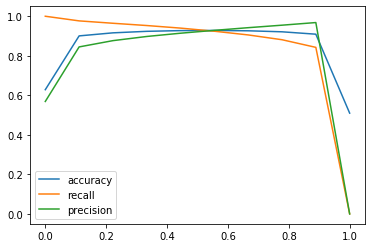

In [0]:
#choose threshold for trade-off between accuracy/precision/recall
lf_threshold(y2D_test,model_2D.predict(X2D_test)) 

In [0]:
#set threshold and evaluate
threshold_2D = 0.5
model_2D.threshold = threshold_2D
y2D_pred = model_2D.predict(X2D_test)
y2D_pred_clipped = clip_prediction_at_treshold(y2D_pred,threshold_2D)
evaluate_model(model_2D,y2D_pred_clipped,y2D_test)

accuracy = 0.9278261460101868 
precision = 0.9214722565342784 
recall = 0.9322084852649428


In [0]:
model_2D.save(os.path.join(root_dir,'model_2D_aug.h5'))

#### Deep model 25x25

In [0]:
#model for 25x25 window
#make training_data
# README before running set set_window_size = 25 and set_step = 10 in parameters on top, note to self, shouljd have been passed as funciton parameter
#To check how skewed data is, simply run y25.mean()/255


mask_windows_list_25, img_windows_list_25 = create_training_arrays(pictures_with_panels) #need to find second source of negative indexes to use rest of training data"

print(f'number of vectors from cropping around solar panels : {mask_windows_list_25.shape[0]}')
print('The proportion of solar panels in training data (in terms of pixels) is : ',mask_windows_list_25.mean()/255)

for pic_name in pictures_of_forests[2:4]:
  #read the pic, turn it into vectors and make corresponding empty mask
  forest_pic = cv2.imread(os.path.join(root_dir,'SolarData','Forests',pic_name))
  forests_mask_windows_list_25, forests_img_windows_list_25 = vectors_from_empty_image(forest_pic)
  #check training data balance
  print(forests_mask_windows_list_25.mean())
  #append both arrays to training data set
  mask_windows_list_25 = np.vstack((mask_windows_list_25, forests_mask_windows_list_25))
  img_windows_list_25 = np.vstack((img_windows_list_25, forests_img_windows_list_25))
  #free memory
  del forests_mask_windows_list_25, forests_img_windows_list_25, forest_pic

print(f'number of vectors after adding forest photos : {mask_windows_list_25.shape[0]}')

X25 = img_windows_list_25/255
y25 = mask_windows_list_25/255
print('The proportion of solar panels in training data (in terms of pixels) is : ',y25.mean())

del mask_windows_list_25, img_windows_list_25

X25_train, X25_test, y25_train, y25_test = train_test_split(X25, y25, test_size=0.15, random_state=42, shuffle = True)

In [0]:
model_25 = Sequential()
model_25.add(Dense(3000, input_dim=1875, activation='relu'))
model_25.add(Dense(2000, activation='relu'))
model_25.add(Dense(2000, activation='relu'))
model_25.add(Dense(2000, activation='relu'))
model_25.add(Dense(2000, activation='relu'))
model_25.add(Dense(2000, activation='relu'))
model_25.add(Dense(2000, activation='relu'))
model_25.add(Dense(625, activation='sigmoid'))
model_25.compile(optimizer="adam",loss="binary_crossentropy",metrics=['accuracy'])

In [0]:
history_25 = model_25.fit(X25_train, y25_train, epochs = 300, batch_size = 1000, validation_data = (X25_test, y25_test))
plot_learning(history_25)

In [0]:
lf_threshold(y25_test,model_25.predict(X25_test)) 

In [0]:
threshold_25 = 0.27
model_25.threshold = threshold_25
y25_pred = model_25.predict(X25_test)
y25_pred_clipped = clip_prediction_at_treshold(y25_pred,threshold_25)
evaluate_model(model_25,y25_pred_clipped,y25_test)

In [0]:
#model_25.save(os.path.join(root_dir,'model_temp.h5'))

# Make predictions

#### Load trained models

In [0]:
from keras.models import load_model
model_25 = load_model(os.path.join(root_dir,'SolarData','SavedModels','model_25.h5'))
model_25.threshold = 0.27

#### Functions

In [0]:
def create_prediction_array(picture):
  img_window_array = np.empty(shape=(0,set_window_size,set_window_size,3)) #store in format for input into convo2D layer
  window_list_2D = sliding_window_view(picture, pred_img_window_shape, pred_img_step)
  
  img_window_array = np.concatenate((img_window_array,reshape_windows(window_list_2D, form = 'image')))
  return img_window_array

In [0]:
def reconstruct_prediction_mask(image,predicted_vectors):
  #reconstruct windows form model output (1d to 2d)
  if debug : print(f'image shape = {image.shape} and predicted_vectors.shape = {predicted_vectors.shape}')
  prediction_windows = np.reshape(predicted_vectors,newshape=(predicted_vectors.shape[0],set_window_size,set_window_size))

  #we can reconstruct a mask minus the borders that got cut in the sliding windows process, we set the borders to zero
  mask=np.zeros((image.shape[0],image.shape[1]))
  
  #this for loop adds the mask bit by bit to the empty mask
  i = 0
  for p in range((image.shape[0]//pred_step)):

    for q in range((image.shape[1]//pred_step)):
      if debug:
        #print('p,q,i',p,q,i)
        if mask[pred_step*p:pred_step*p+set_window_size, pred_step*q:pred_step*q+set_window_size].shape != prediction_windows[i].shape:
          print('the shapes do not fit in reconstruct_prediction_mask')
      
      mask[pred_step*p:pred_step*p+set_window_size,  pred_step*q:pred_step*q+set_window_size] = prediction_windows[i]
      i+=1

  return mask

In [0]:
def predict(used_model,image,show = False):
  
  #make prediction and clip at chosen threshold
  X = create_prediction_array(image)
  y_pred = used_model.predict_proba(X)
  clipped_y_pred = clip_prediction_at_treshold(y_pred,used_model.threshold)

  #reconstruct mask and turn into transparent overlay
  reconstructed_mask = reconstruct_prediction_mask(image,clipped_y_pred)

  if show:
    show_image_prediction_overlay(image,reconstructed_mask)

  return reconstructed_mask

In [0]:
def show_image_prediction_overlay(image,mask):
  redImg = np.zeros(image.shape, image.dtype)
  redImg[:,:] = (0, 0, 255)
  redMask = cv2.bitwise_and(redImg, redImg, mask=mask.astype(np.uint8))
  overlaid_img = cv2.addWeighted(redMask, 1, image, 1, 0, image)
  cv2_imshow(overlaid_img)

#### Make predictions

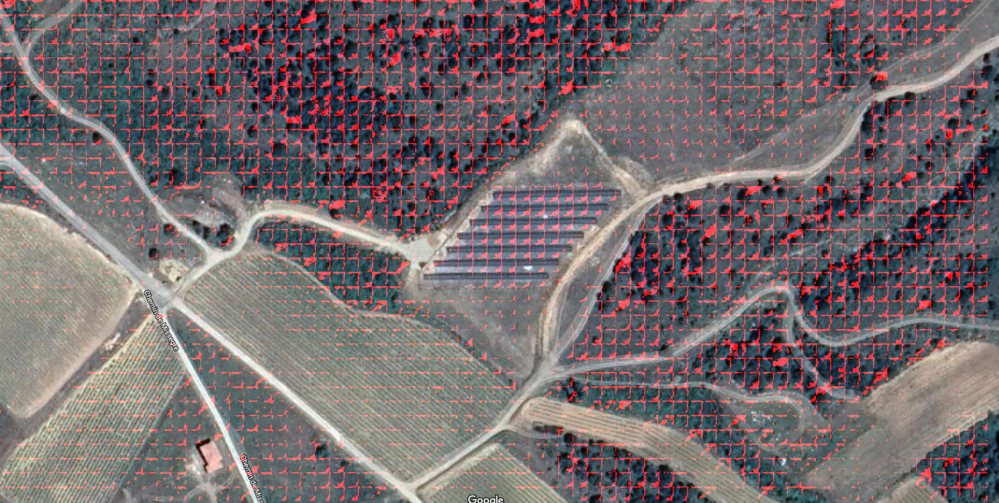

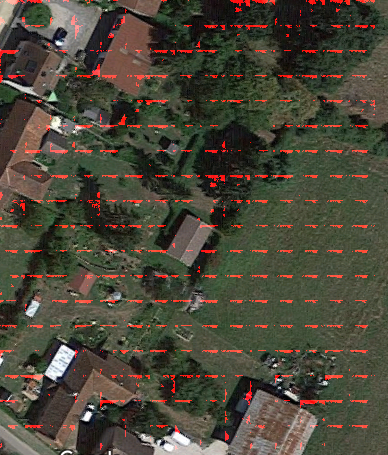

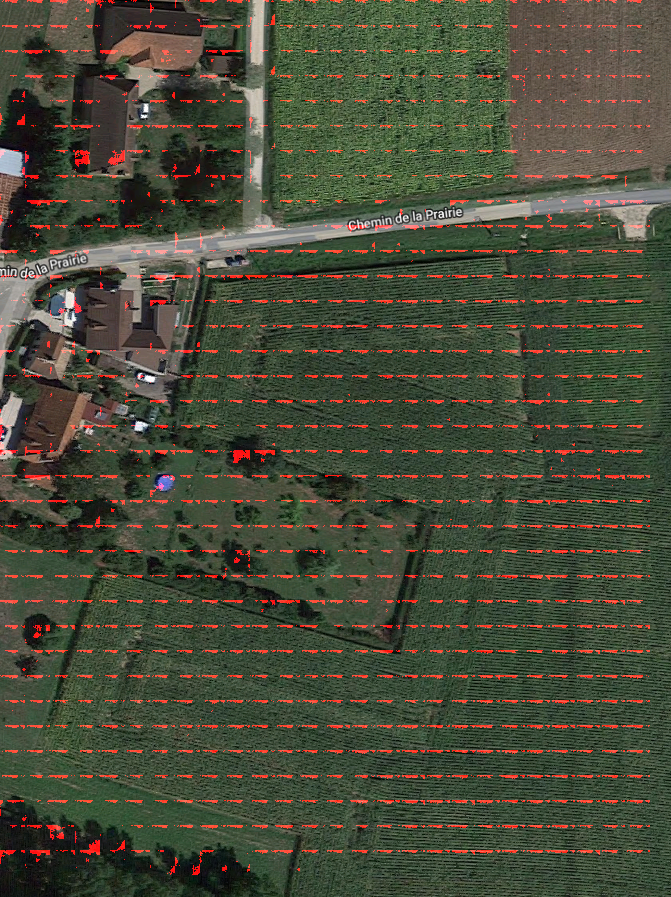

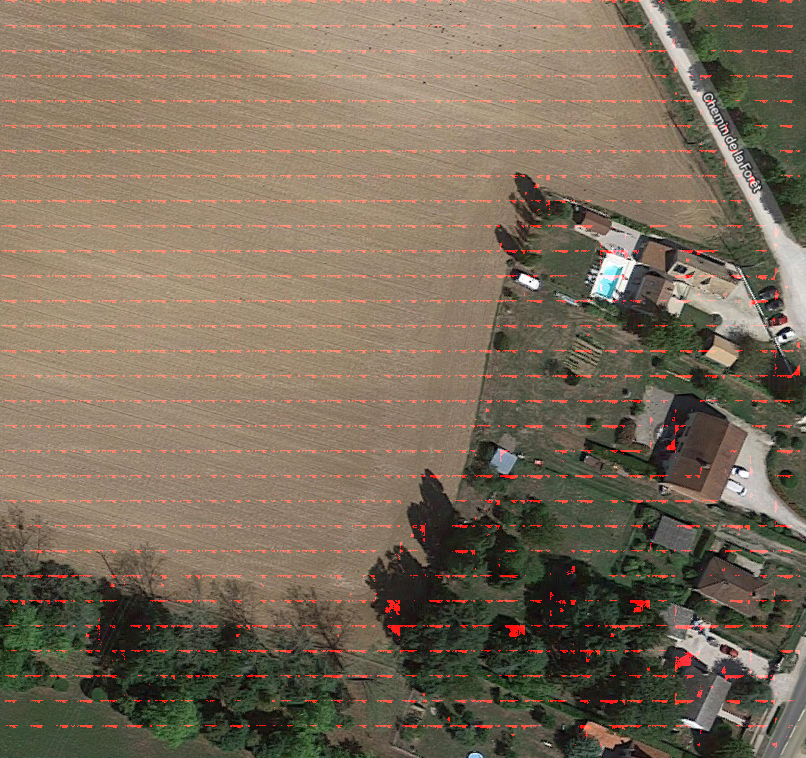

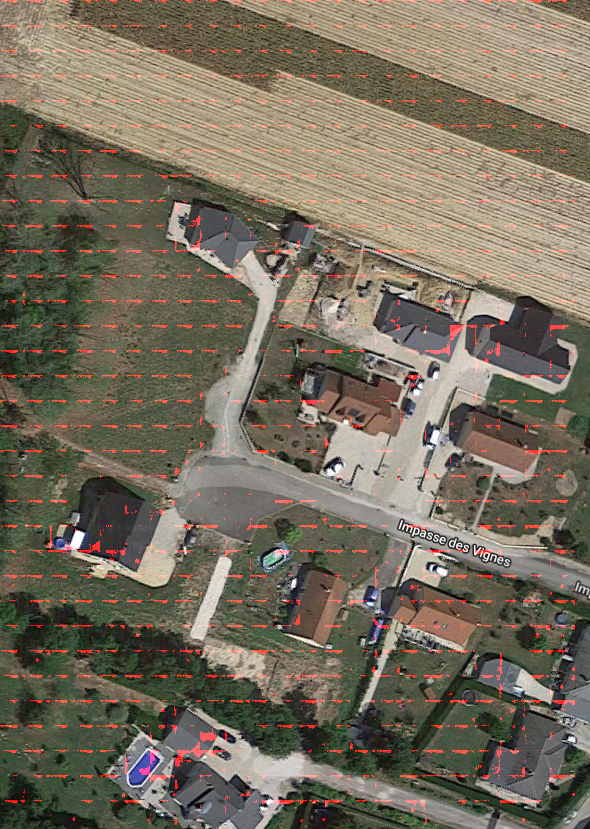

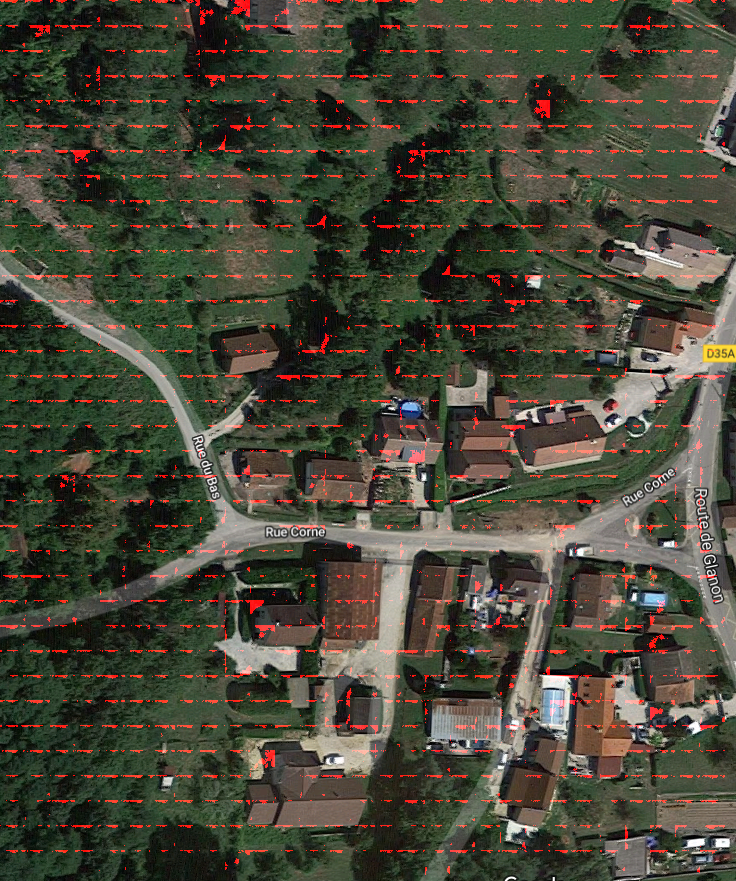

In [0]:
#I do not have all pictures yet, this way i can iterate only over the pics i have
screenshots_path = os.path.join(root_dir,'SolarData','PredPhotos','Screenshots')
screenshots_i_have = []
for root, dirs, files in os.walk(screenshots_path):
    for filename in files:
        if 'xml' not in filename:
          screenshots_i_have.append(filename) #NB, with extensions this time

screenshot_list = []
for screenshot_name in screenshots_i_have:
  screenshot_list.append(cv2.imread(os.path.join(screenshots_path,screenshot_name)))

Y = []
for picture_name in screenshots_i_have:
  image = cv2.imread(os.path.join(screenshots_path,picture_name))
  Y.append(predict(model_2D,image,show=True))

In [0]:
image = cv2.imread(os.path.join(root_dir, 'SolarData', 'Photos',pictures_with_panels[0]+'.tif'))
predict(model_2D, image, show = True)

windows_list.shape = (200, 200, 25, 25, 3), pixels_per_window = 1875, number_of_windows = 40000
image shape = (5000, 5000, 3) and predicted_vectors.shape = (40000, 625)


# Test functions

In [0]:
def test_prediction_and_reshaping(image = cv2.imread(os.path.join(screenshots_path,'sat_aude.PNG')),tested_model = model_25):
  
  #make vectors from the windows of the image and predict
  X_test = create_prediction_array(image)
  y_pred_test = tested_model.predict(X_test)

  #clip
  pixel_clipped_y_pred = clip_prediction_at_treshold(y_pred_test,tested_model.threshold)
  window_clipped_y_pred = clip_prediction_per_window(y_pred_test,tested_model.threshold)

  #rebuild mask form predicted vectors
  reconstructed_mask = reconstruct_prediction_mask(image,y_pred_test)
  pixel_clipped_mask = reconstruct_prediction_mask(image,pixel_clipped_y_pred)
  window_clipped_mask = reconstruct_prediction_mask(image,window_clipped_y_pred)

  #show
  print('original image :')
  cv2_imshow(image)

  print('mask after pixel clipping :')
  cv2_imshow(pixel_clipped_mask*255)

  print('mask after window clipping :')
  cv2_imshow(window_clipped_mask*255)

  print('mask without clipping :')
  cv2_imshow(reconstructed_mask*255)
 

NameError: ignored

windows_list.shape = (35, 69, 25, 25, 3), pixels_per_window = 1875, number_of_windows = 2415
y_pred shape (2415, 625)
y_pred_mean shape (2415,)
image shape = (879, 1745, 3) and predicted_vectors.shape = (2415, 625)
image shape = (879, 1745, 3) and predicted_vectors.shape = (2415, 625)
image shape = (879, 1745, 3) and predicted_vectors.shape = (2415, 625)
original image :


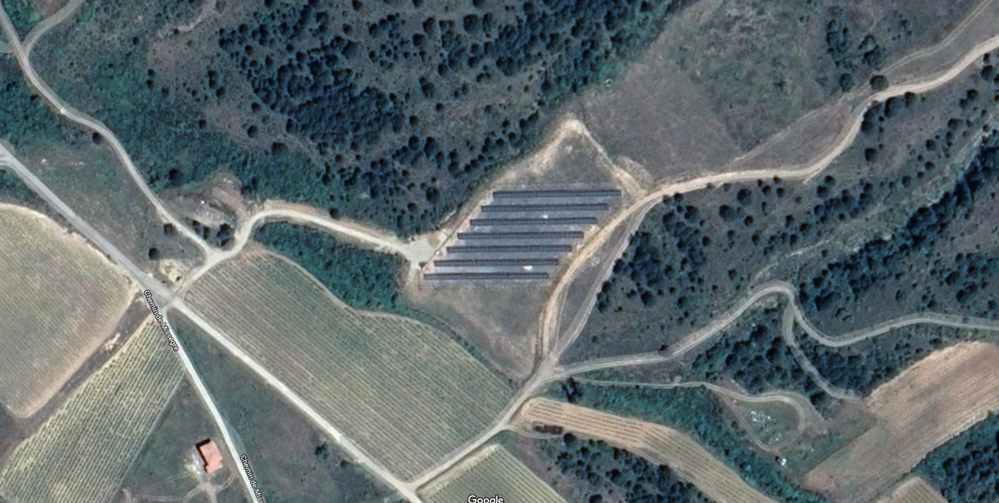

mask after pixel clipping :


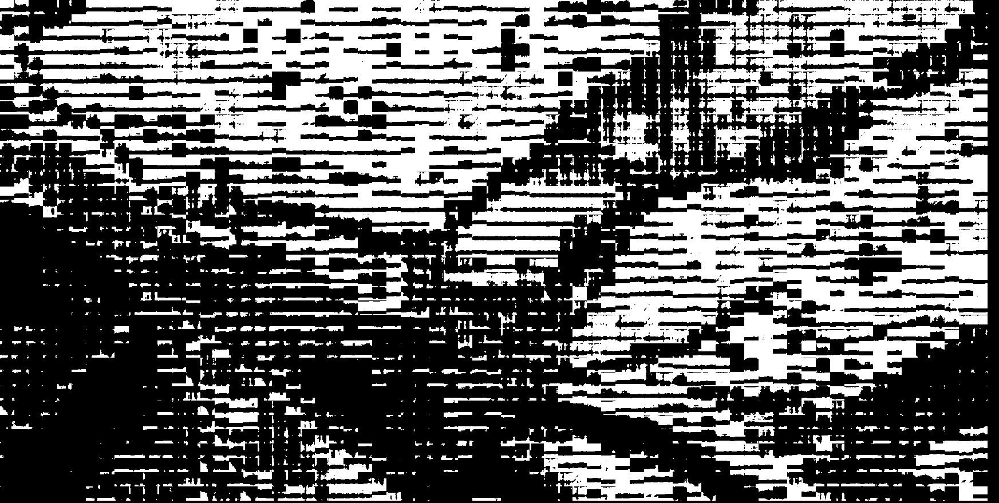

mask after window clipping :


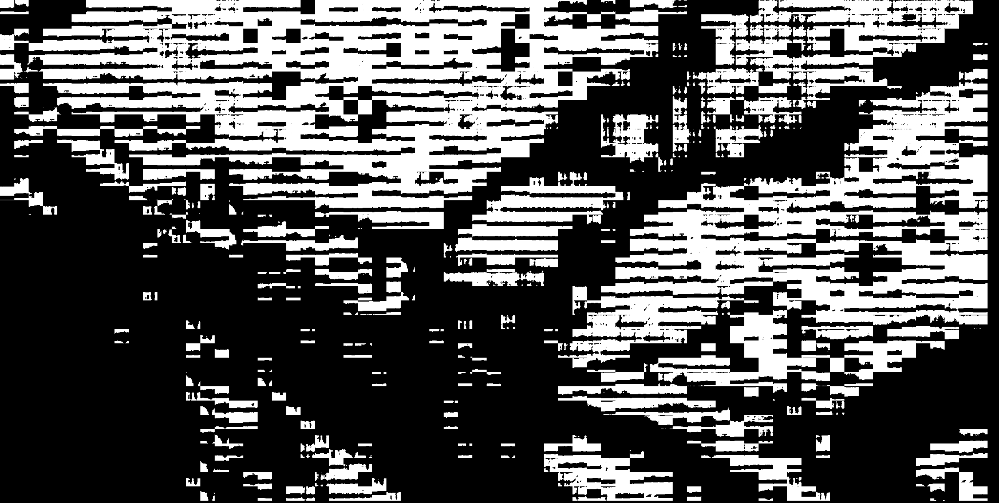

mask without clipping :


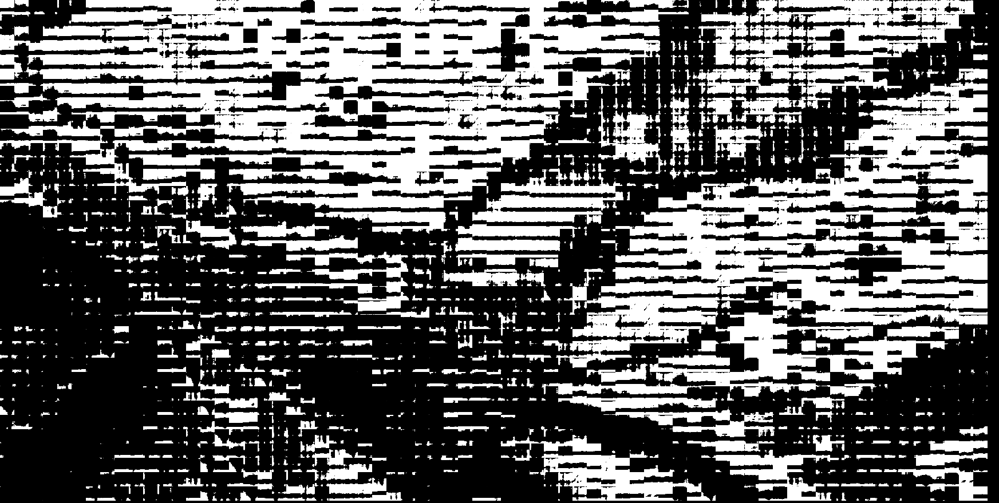

In [0]:
debug = True
test_prediction_and_reshaping(tested_model = model_25)

In [0]:
def test_windows_and_reshaping(image = cv2.imread(os.path.join(root_dir,'SolarData','test.png'),0)):
  #Load image
  
  img_windows = sliding_window_view(image,(pred_step,pred_step),(pred_step,pred_step))
  img_vectors = reshape_windows(img_windows, form = 'image')
  #clipped_y_pred = clip_prediction_at_treshold(y_pred_test,tested_model.threshold)

  reconstructed_img = reconstruct_prediction_mask(image,img_vectors)

  cv2_imshow(reconstructed_img)
  cv2_imshow(image)

In [0]:
test_windows_and_reshaping()

ValueError: ignored

In [0]:
def test_cropping_and_sliding_windows(image_name = pictures_with_panels[2]):
  test_img_name = image_name
  test_mask_windows_list, test_img_windows_list = create_training_arrays([test_img_name])
  test_truncated_img_list,test_truncated_mask_list = truncate_around_panels(test_img_name)

  for i in range(len(test_truncated_img_list)):
    print(f'\ncropped image n°{i}\n')
    cv2_imshow(test_truncated_img_list[i])
    print(f'\ncropped mask n°{i}\n')
    cv2_imshow(test_truncated_mask_list[i])


  i = 0
  for mask_window_vector in test_mask_windows_list:
    print(f'cropped mask window n°{i}')
    cv2_imshow(np.reshape(test_mask_windows_list[i],newshape=(set_window_size,set_window_size))) #all white means they re only zeroes
    i += 1

100%|██████████| 1/1 [00:00<00:00,  4.41it/s]



cropped image n°0



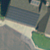


cropped mask n°0



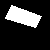

cropped mask window n°0


cropped mask window n°1


cropped mask window n°2


cropped mask window n°3


cropped mask window n°4


cropped mask window n°5


cropped mask window n°6


cropped mask window n°7


cropped mask window n°8


In [0]:
test_cropping_and_sliding_windows()

windows_list.shape = (35, 69, 25, 25, 3), pixels_per_window = 1875, number_of_windows = 2415
image shape = (879, 1745, 3) and predicted_vectors.shape = (2415, 625)


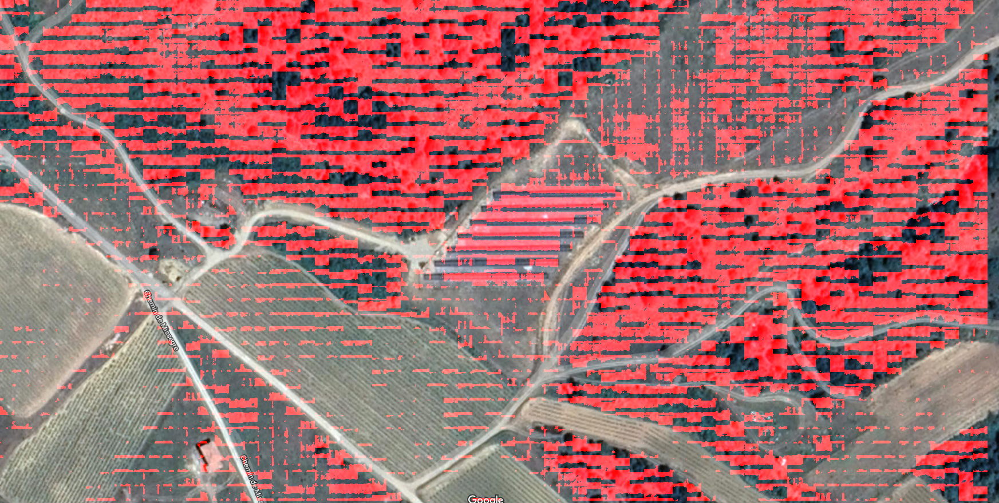

array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [0]:
test_image = cv2.imread(os.path.join(screenshots_path,'sat_aude.PNG'))
predict(model_25, test_image,show=True)

In [0]:
#ToDo Change sliding windows algorithm to avoid the bars (due to the fact that there is always a window of the top left around a panel, and not on the right or the bottom)
#ToDo flips and turns on the windows (to solve same issue)
#ToDo add features, esp. that would help distinguish trees from panels -> is there a corner, average color on a 10m*10m square (for forests), circles (to recognise lone trees) -> 
#ToDo try to find pre-trained networks for featur generation
#ToDo Standard image processing (even out colors, gaussian blur, salt and pepper)